Parametri globali

In [1]:
alpha=0.2
nfold=10

Import librerie

In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import re
from nltk.corpus import stopwords
from nltk.stem.snowball import SnowballStemmer
from nltk.tokenize import word_tokenize 
from sklearn.feature_extraction.text import CountVectorizer, TfidfTransformer
from sklearn.model_selection import StratifiedKFold
from sklearn import metrics
import seaborn as sns
from sklearn.feature_selection import SelectKBest, chi2, mutual_info_classif
from sklearn.metrics import confusion_matrix, precision_recall_fscore_support
from sklearn.naive_bayes import ComplementNB
from sklearn.pipeline import make_pipeline
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.ensemble import RandomForestClassifier
from lime import lime_text
import unicodedata

Import dataset

In [3]:
df = pd.read_excel('./politica.xlsx', sheet_name="Foglio1")
print(f'Found {len(df)} texts.')

print(f'{df["cap_maj_master"].isnull().sum()} document(s) with no classification removed')
df=df[pd.notnull(df['cap_maj_master'])]

print(f'{df["testo"].isnull().sum()} document(s) with no text removed')
df=df[pd.notnull(df['testo'])]

classes = [int(c) for c in df['cap_maj_master']]
documents = [d for d in df['testo']]

Found 5674 texts.
2 document(s) with no classification removed
424 document(s) with no text removed


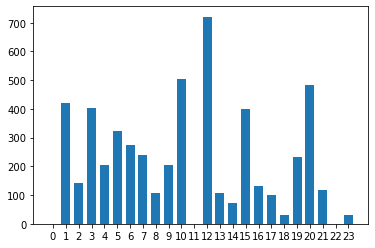

In [4]:
y = np.bincount(classes)
x = np.arange(len(y))
fig, ax = plt.subplots()
plt.bar(x, y,width=0.7)
ax.set_xticks(x)
ax.set_aspect('auto')
plt.show()


preprocessing

In [5]:
def preprocessor(text):
    text = re.sub('<[^>]*>', ' ', str(text))
    text=re.sub('\d+',' ',str(text))
    text=re.sub('[ﾫﾻ]','',str(text))
    emoticons = re.findall('(?::|;|=)(?:-)?(?:\)|\(|D|P)',
                           str(text))
    text = (re.sub('[\W]+', ' ', text.lower()) + ' ' +
            ' '.join(emoticons).replace('-', ''))
    return text

def strip_accents(text):
    """
    Strip accents from input String.

    :param text: The input string.
    :type text: String.

    :returns: The processed String.
    :rtype: String.
    """
    try:
        text = unicode(text, 'utf-8')
    except (TypeError, NameError): # unicode is a default on python 3 
        pass
    text = unicodedata.normalize('NFD', text)
    text = text.encode('ascii', 'ignore')
    text = text.decode("utf-8")
    return str(text)

stop=set(stopwords.words('italian'))

def tokenizer_porter(text):
    word_tokens = word_tokenize(text)
    stemmer = SnowballStemmer("italian", ignore_stopwords=True)
    return [stemmer.stem(word) for word in word_tokens]
  

def tokenizer(text):
    stop=set(stopwords.words('italian'))
    word_tokens = word_tokenize(text)
    filtered_sentence = [w for w in word_tokens if not w in stop]
    filtered_sentence = [w for w in filtered_sentence if len(w)>3]
    return filtered_sentence

In [8]:
number_of_feature = 4000

Feature trovati: 8432
Feature usati: 1000


c:\users\berto\appdata\local\programs\python\python38\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


--------------- Fold:  1 ---------------------

Accuracy: 0.63
Detail:
              precision    recall  f1-score   support

           1       0.47      0.79      0.59        42
           2       0.00      0.00      0.00        15
           3       0.71      0.75      0.73        40
           4       0.58      0.71      0.64        21
           5       0.72      0.66      0.69        32
           6       0.68      1.00      0.81        27
           7       0.81      0.88      0.84        24
           8       0.50      0.27      0.35        11
           9       0.56      0.45      0.50        20
          10       0.65      0.90      0.76        50
          12       0.66      0.89      0.76        73
          13       1.00      0.18      0.31        11
          14       1.00      0.14      0.25         7
          15       0.70      0.40      0.51        40
          16       0.67      0.62      0.64        13
          17       0.00      0.00      0.00        10
          

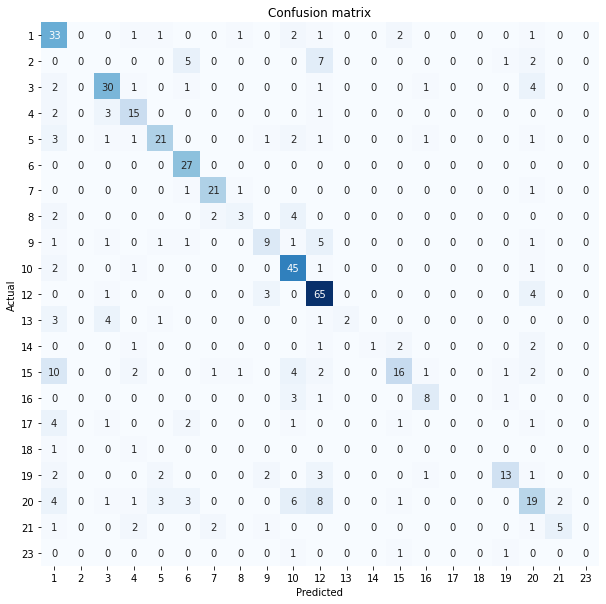

True: 1 --> Pred: 1 | Prob: 0.06


Feature trovati: 8461
Feature usati: 1000


c:\users\berto\appdata\local\programs\python\python38\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


--------------- Fold:  2 ---------------------

Accuracy: 0.61
Detail:
              precision    recall  f1-score   support

           1       0.54      0.64      0.59        42
           2       0.00      0.00      0.00        15
           3       0.70      0.80      0.74        40
           4       0.62      0.71      0.67        21
           5       0.64      0.56      0.60        32
           6       0.67      0.96      0.79        27
           7       0.61      0.79      0.69        24
           8       0.64      0.64      0.64        11
           9       0.73      0.55      0.63        20
          10       0.65      0.90      0.76        50
          12       0.54      0.83      0.65        72
          13       0.00      0.00      0.00        11
          14       1.00      0.14      0.25         7
          15       0.67      0.35      0.46        40
          16       0.69      0.69      0.69        13
          17       1.00      0.20      0.33        10
          

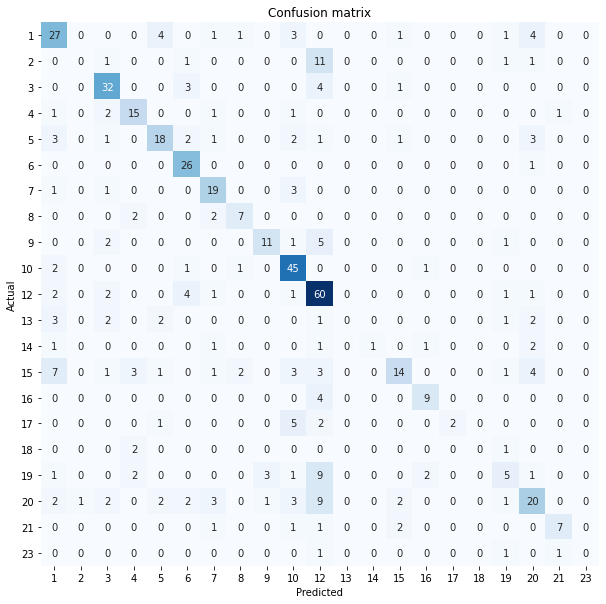

True: 15 --> Pred: 10 | Prob: 0.06


Feature trovati: 8456
Feature usati: 1000


c:\users\berto\appdata\local\programs\python\python38\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


--------------- Fold:  3 ---------------------

Accuracy: 0.57
Detail:
              precision    recall  f1-score   support

           1       0.47      0.64      0.54        42
           2       0.00      0.00      0.00        15
           3       0.60      0.72      0.66        40
           4       0.60      0.60      0.60        20
           5       0.62      0.45      0.53        33
           6       0.65      0.93      0.76        28
           7       0.54      0.62      0.58        24
           8       1.00      0.64      0.78        11
           9       0.80      0.60      0.69        20
          10       0.65      0.80      0.71        50
          12       0.57      0.88      0.69        72
          13       0.75      0.27      0.40        11
          14       0.00      0.00      0.00         7
          15       0.50      0.28      0.35        40
          16       0.62      0.38      0.48        13
          17       0.00      0.00      0.00        10
          

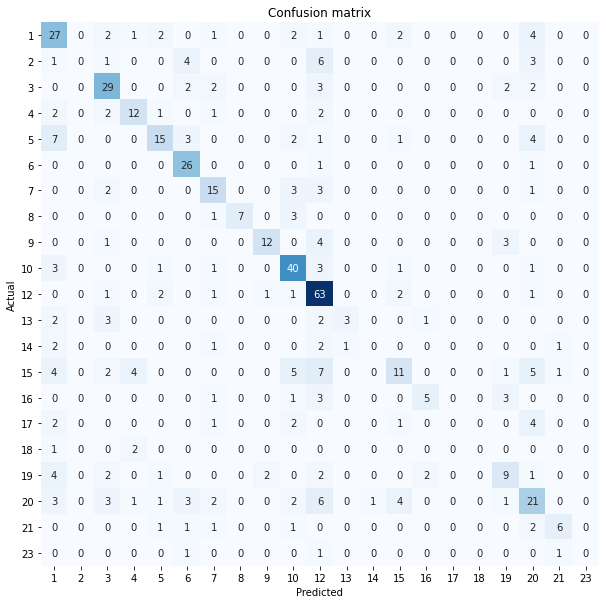

True: 1 --> Pred: 1 | Prob: 0.05


Feature trovati: 8458
Feature usati: 1000


c:\users\berto\appdata\local\programs\python\python38\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


--------------- Fold:  4 ---------------------

Accuracy: 0.58
Detail:
              precision    recall  f1-score   support

           1       0.42      0.48      0.44        42
           2       0.00      0.00      0.00        14
           3       0.71      0.72      0.72        40
           4       0.67      0.70      0.68        20
           5       0.61      0.61      0.61        33
           6       0.62      0.89      0.74        28
           7       0.55      0.71      0.62        24
           8       0.86      0.55      0.67        11
           9       0.72      0.65      0.68        20
          10       0.61      0.82      0.70        50
          12       0.57      0.86      0.69        72
          13       0.40      0.18      0.25        11
          14       0.50      0.14      0.22         7
          15       0.59      0.40      0.48        40
          16       0.77      0.77      0.77        13
          17       0.00      0.00      0.00        10
          

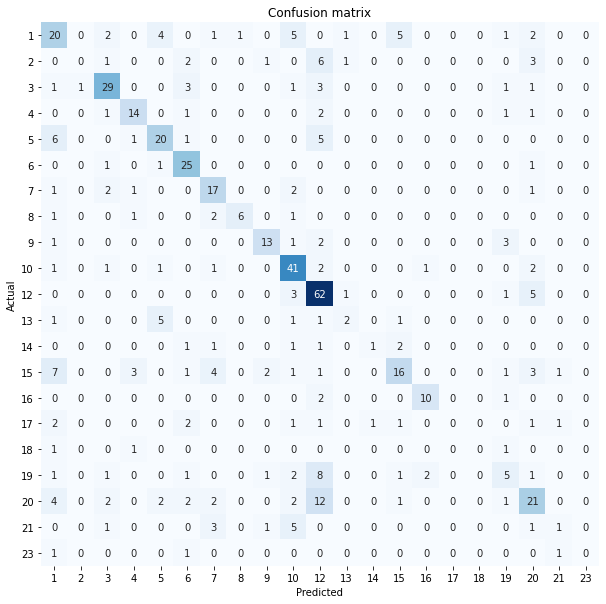

True: 1 --> Pred: 1 | Prob: 0.05


Feature trovati: 8472
Feature usati: 1000


c:\users\berto\appdata\local\programs\python\python38\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


--------------- Fold:  5 ---------------------

Accuracy: 0.62
Detail:
              precision    recall  f1-score   support

           1       0.55      0.67      0.60        42
           2       0.00      0.00      0.00        14
           3       0.72      0.72      0.73        40
           4       0.40      0.50      0.44        20
           5       0.67      0.67      0.67        33
           6       0.69      0.96      0.81        28
           7       0.56      0.61      0.58        23
           8       0.50      0.45      0.48        11
           9       0.64      0.80      0.71        20
          10       0.60      0.88      0.72        50
          12       0.59      0.83      0.69        72
          13       0.67      0.18      0.29        11
          14       1.00      0.14      0.25         7
          15       0.58      0.35      0.44        40
          16       0.73      0.57      0.64        14
          17       0.00      0.00      0.00        10
          

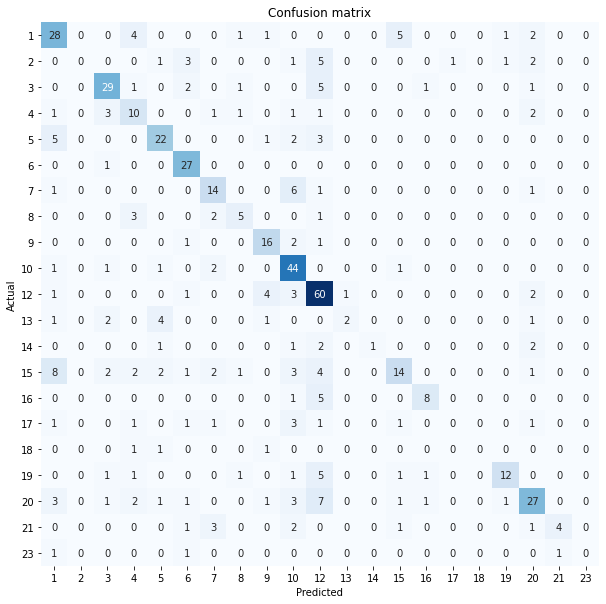

True: 1 --> Pred: 1 | Prob: 0.05


Feature trovati: 8468
Feature usati: 1000


c:\users\berto\appdata\local\programs\python\python38\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


--------------- Fold:  6 ---------------------

Accuracy: 0.6
Detail:
              precision    recall  f1-score   support

           1       0.44      0.62      0.51        42
           2       0.00      0.00      0.00        14
           3       0.82      0.78      0.79        40
           4       0.71      0.75      0.73        20
           5       0.54      0.58      0.56        33
           6       0.58      0.96      0.72        27
           7       0.65      0.71      0.68        24
           8       0.86      0.55      0.67        11
           9       0.87      0.65      0.74        20
          10       0.72      0.84      0.77        51
          12       0.54      0.81      0.65        72
          13       0.50      0.18      0.27        11
          14       1.00      0.14      0.25         7
          15       0.57      0.40      0.47        40
          16       0.78      0.50      0.61        14
          17       1.00      0.10      0.18        10
          1

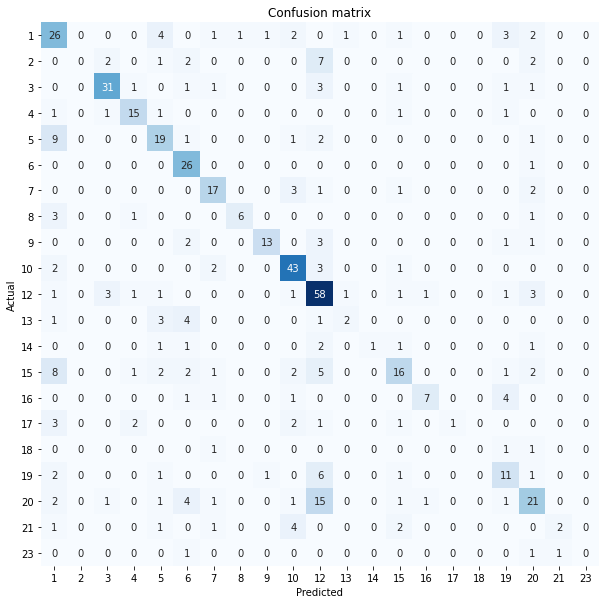

True: 1 --> Pred: 1 | Prob: 0.06


Feature trovati: 8399
Feature usati: 1000


c:\users\berto\appdata\local\programs\python\python38\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


--------------- Fold:  7 ---------------------

Accuracy: 0.62
Detail:
              precision    recall  f1-score   support

           1       0.56      0.79      0.65        42
           2       0.00      0.00      0.00        14
           3       0.79      0.66      0.72        41
           4       0.62      0.65      0.63        20
           5       0.66      0.59      0.62        32
           6       0.57      1.00      0.73        27
           7       0.64      0.75      0.69        24
           8       0.80      0.36      0.50        11
           9       0.83      0.48      0.61        21
          10       0.62      0.78      0.70        51
          12       0.56      0.85      0.67        72
          13       0.33      0.09      0.14        11
          14       1.00      0.29      0.44         7
          15       0.55      0.44      0.49        39
          16       0.90      0.69      0.78        13
          17       1.00      0.09      0.17        11
          

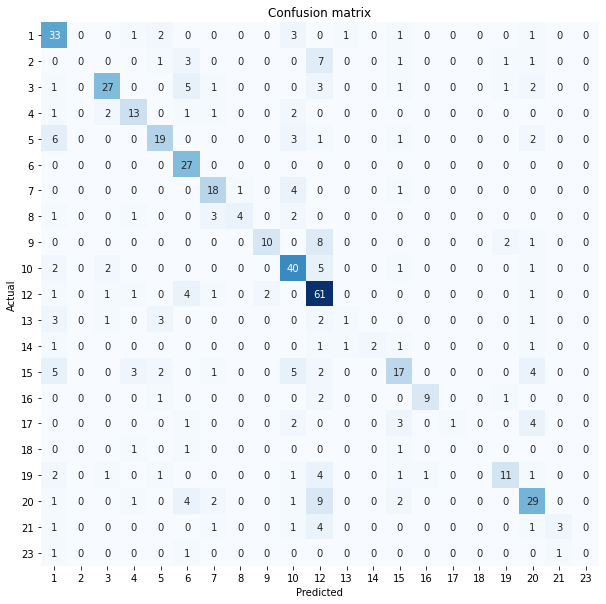

True: 12 --> Pred: 12 | Prob: 0.05


Feature trovati: 8469
Feature usati: 1000


c:\users\berto\appdata\local\programs\python\python38\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


--------------- Fold:  8 ---------------------

Accuracy: 0.63
Detail:
              precision    recall  f1-score   support

           1       0.52      0.74      0.61        42
           2       0.00      0.00      0.00        14
           3       0.78      0.88      0.83        41
           4       0.68      0.71      0.70        21
           5       0.64      0.50      0.56        32
           6       0.59      0.96      0.73        27
           7       0.73      0.67      0.70        24
           8       0.80      0.40      0.53        10
           9       0.93      0.62      0.74        21
          10       0.68      0.84      0.75        51
          12       0.60      0.86      0.70        72
          13       1.00      0.30      0.46        10
          14       1.00      0.12      0.22         8
          15       0.60      0.38      0.46        40
          16       0.71      0.77      0.74        13
          17       0.00      0.00      0.00        10
          

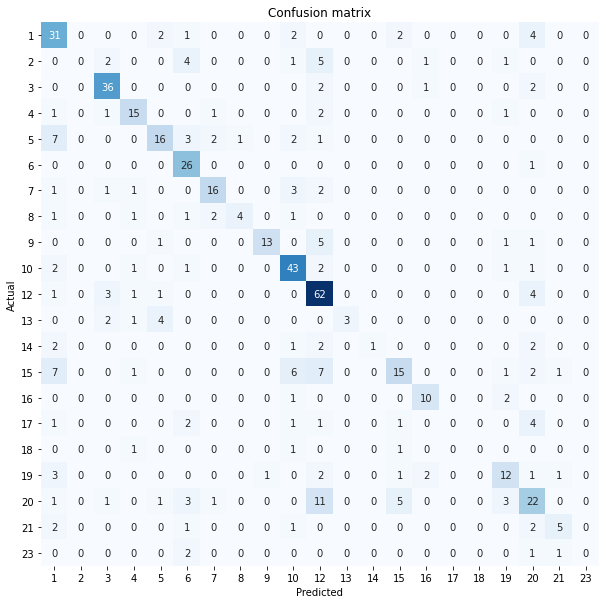

True: 1 --> Pred: 10 | Prob: 0.05


Feature trovati: 8435
Feature usati: 1000


c:\users\berto\appdata\local\programs\python\python38\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


--------------- Fold:  9 ---------------------

Accuracy: 0.65
Detail:
              precision    recall  f1-score   support

           1       0.53      0.74      0.61        42
           2       1.00      0.07      0.13        14
           3       0.80      0.90      0.85        41
           4       0.79      0.71      0.75        21
           5       0.71      0.62      0.67        32
           6       0.79      0.96      0.87        27
           7       0.68      0.79      0.73        24
           8       0.83      0.50      0.62        10
           9       0.79      0.71      0.75        21
          10       0.65      0.76      0.70        51
          12       0.60      0.97      0.74        72
          13       0.50      0.10      0.17        10
          14       1.00      0.50      0.67         8
          15       0.78      0.35      0.48        40
          16       0.73      0.62      0.67        13
          17       1.00      0.10      0.18        10
          

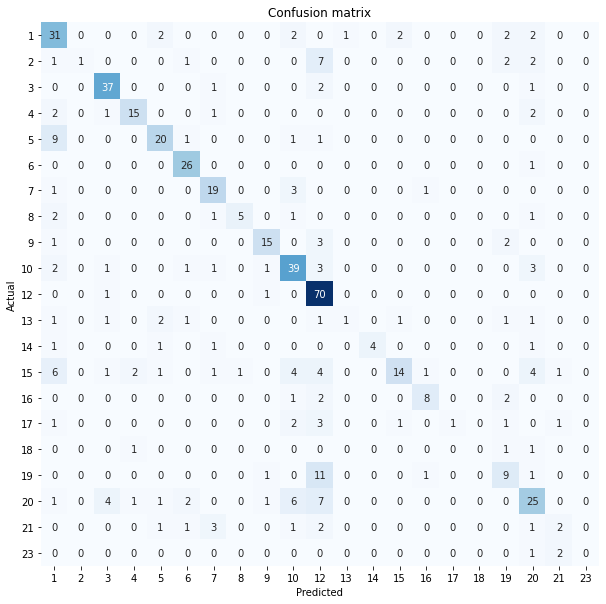

True: 1 --> Pred: 19 | Prob: 0.06


Feature trovati: 8425
Feature usati: 1000


c:\users\berto\appdata\local\programs\python\python38\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


--------------- Fold: 10 ---------------------

Accuracy: 0.64
Detail:
              precision    recall  f1-score   support

           1       0.54      0.76      0.63        42
           2       1.00      0.07      0.13        14
           3       0.76      0.85      0.80        40
           4       0.74      0.67      0.70        21
           5       0.62      0.50      0.55        32
           6       0.67      0.89      0.76        27
           7       0.71      0.83      0.77        24
           8       0.83      0.50      0.62        10
           9       0.68      0.75      0.71        20
          10       0.67      0.84      0.75        51
          12       0.60      0.89      0.72        72
          13       1.00      0.20      0.33        10
          14       1.00      0.25      0.40         8
          15       0.50      0.33      0.39        40
          16       0.75      0.69      0.72        13
          17       0.50      0.10      0.17        10
          

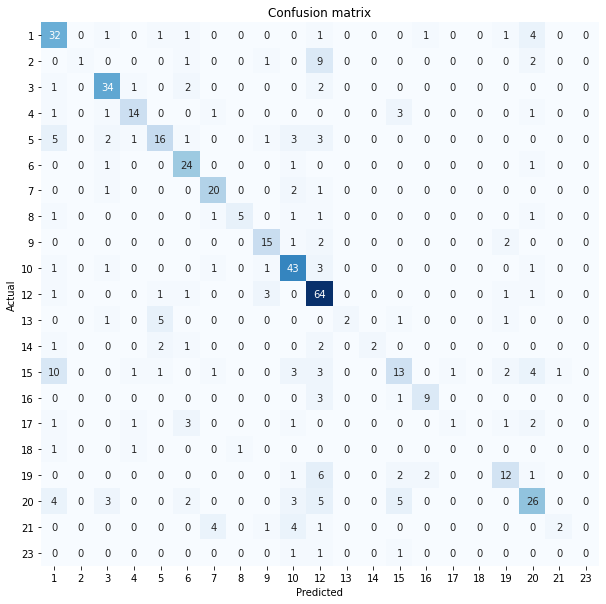

True: 1 --> Pred: 1 | Prob: 0.06


Overall results of the cross-validation procedure


CV accuracy: 61.5 +/- 2.5

CV precision: 60.2 +/- 4.0

CV recall: 61.5 +/- 2.5

CV f1: 58.3 +/- 2.5


In [6]:

X=np.array(documents)
y=np.array(classes)
kfold = StratifiedKFold(n_splits=nfold,shuffle=True,random_state=1).split(X, y)

accuracys = []
scores= []
metriche = np.zeros((nfold,4,len(np.unique(classes))))
target_names=list(map(str,np.unique(classes)))

for k, (train, test) in enumerate(kfold):
    #inizio procedura feature selection
    #/////////////////////////////////#
    tfidf = TfidfVectorizer(strip_accents=strip_accents,
                        lowercase=False,
                        preprocessor=preprocessor,
                        tokenizer=tokenizer_porter,
                        stop_words=stop,
                        min_df = 4
                       )

    final_features = tfidf.fit_transform(X[train])
    print("Feature trovati:",final_features.toarray().shape[1])
    
    X_names=tfidf.get_feature_names()
    number_of_feature = 1000
    
    dtf_features = pd.DataFrame()
    MI_score = mutual_info_classif(final_features, y[train], random_state=0)
    dtf_features = dtf_features.append(pd.DataFrame({"feature":X_names, "MI_score":MI_score}))
    dtf_features = dtf_features.sort_values(["MI_score"], ascending=[False])
    dtf_features = dtf_features.head(number_of_feature)
    X_names = dtf_features["feature"].unique().tolist()
    
    
        
    tfidf = TfidfVectorizer(strip_accents=strip_accents,
                        lowercase=False,
                        preprocessor=preprocessor,
                        tokenizer=tokenizer_porter,
                        stop_words=stop,
                        min_df = 4,
                        vocabulary=X_names
                       )

    final_features = tfidf.fit_transform(X[train])
    
    print("Feature usati:",final_features.toarray().shape[1])
    
    pipe_lr = make_pipeline(
                        tfidf,
                        ComplementNB(alpha=alpha)
                        )

    #fine procedura feature selection
    #/////////////////////////////////#
    
    pipe_lr.fit(X[train], y[train])
    y_pred=pipe_lr.predict(X[test])
    y_prob=pipe_lr.predict_proba(X[test])
    #y_test_array = pd.get_dummies(y[test], drop_first=False).values
    
    ## calcolo accuracy
    accuracy = pipe_lr.score(X[test], y[test])
    accuracys.append(accuracy)
    
    ## calcolo precision,recall,fscore
    score=precision_recall_fscore_support(y_true=y[test], y_pred=y_pred, average="weighted")
    scores.append(score[0:3])
    
    print('--------------- Fold: %2d ---------------------'% (k+1))
    print()
    print("Accuracy:",  round(accuracy,2))
    print("Detail:")
    print(metrics.classification_report(y[test], y_pred))
    
    dizionario=metrics.classification_report(y[test], y_pred, target_names=target_names,output_dict=True)
    for k_d,(m_id, m_info) in enumerate(dizionario.items()):
        if k_d<len(np.unique(classes)):
            for j_d,key in enumerate(m_info):
                metriche[k,j_d,k_d]=m_info[key]
        else:
            break
    
    ## Plot confusion matrix
    conf_mat = confusion_matrix(y[test], y_pred)
    fig, ax = plt.subplots(figsize=(10,10))
    sns.heatmap(conf_mat, annot=True, fmt='d', ax=ax, cbar=False,cmap=plt.cm.Blues)
    ax.set(xlabel="Predicted", ylabel="Actual", xticklabels=target_names, 
           yticklabels=target_names, title="Confusion matrix")
    plt.yticks(rotation=0)
    
    print()
    
    plt.show()
    
    ## select observation
    i = 0
    txt_instance = X[test][i]
    ## check true value and predicted value
    print("True:", y[test][i], "--> Pred:", y_pred[i], "| Prob:", round(np.max(y_prob[i]),2))
    ## show explanation
    explainer = lime_text.LimeTextExplainer(class_names=target_names)
    explained = explainer.explain_instance(txt_instance, 
                 pipe_lr.predict_proba, num_features=6,top_labels=2)
    explained.show_in_notebook(text=txt_instance, predict_proba=False)

    
arr = np.array(scores)



In [7]:
print("Overall results of the cross-validation procedure")
print()
print(f"{'Class':^7} | {'precision':^9}{'':^6} | {'recall':^10}{'':^5} | {'f1-measure':^6}{'':^5} | {'support':^9}")
for i in range(len(np.unique(classes))):
    print(f"{i :^7} | {np.mean(metriche[:,0,i])*100:^5.2f} +/-{np.std(metriche[:,0,i])*100:^6.2f} | {np.mean(metriche[:,1,i])*100:^5.2f} +/-{np.std(metriche[:,1,i])*100:^6.2f} | {np.mean(metriche[:,2,i])*100:^5.2f} +/-{np.std(metriche[:,2,i])*100:^6.2f} | {np.mean(metriche[:,3,i]):^9.2f}")
print()
print('\nCV accuracy: %.2f +/- %.2f max: %.2f' % (np.mean(accuracys)*100, np.std(accuracys)*100,np.max(accuracys)*100))
print('\nCV precision: %.2f +/- %.2f max: %.2f' % (np.mean(arr[:,0])*100, np.std(arr[:,0])*100,np.max(arr[:,0])*100))
print('\nCV recall: %.2f +/- %.2f max: %.2f' % (np.mean(arr[:,1])*100, np.std(arr[:,1])*100,np.max(arr[:,1])*100))
print('\nCV f1: %.2f +/- %.2f max: %.2f' % (np.mean(arr[:,2])*100, np.std(arr[:,2])*100,np.max(arr[:,2])*100))

Overall results of the cross-validation procedure

 Class  | precision       |   recall        | f1-measure      |  support 


NameError: name 'n_output' is not defined